In [1]:
#Import Of Necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR

import warnings
warnings.simplefilter("ignore")

In [3]:
# loading data
df = pd.read_csv('master.csv')

In [4]:
df['country'].nunique()

101

In [5]:
df.head(5)

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year,gdp_per_capita,generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers


In [6]:
print('Number of Data-points: ',df.shape[0])
print('Number of features:    ',df.shape[1])
print('Features are: ',[i for i in df.columns])

Number of Data-points:  27820
Number of features:     12
Features are:  ['country', 'year', 'sex', 'age', 'suicides_no', 'population', 'suicides/100k pop', 'country-year', 'HDI for year', ' gdp_for_year', 'gdp_per_capita', 'generation']


## EDA

In [7]:
print('Total Number of missing values:',df.isna().sum().sum())

Total Number of missing values: 19456


In [8]:
print('Columns with missing valus: ',[i for i in df.columns if df[i].isna().sum()>0])

Columns with missing valus:  ['HDI for year']


In [9]:
df.head(1)

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year,gdp_per_capita,generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X


#### Analysing variable 'sex'

In [10]:
# Do we have same number of  data-points of males and females?
# Yes, the number of data-points are same for both the genders.
df['sex'].value_counts()

male      13910
female    13910
Name: sex, dtype: int64

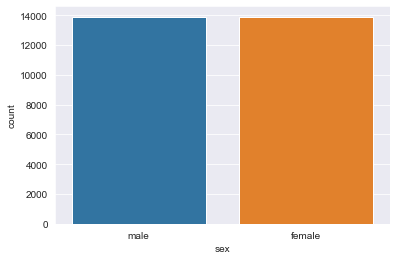

In [11]:
sns.set_style('darkgrid')
plt.figure(figsize=(6,4))
sns.countplot(df['sex'])

Observation: We have equal number of data-points for both males and females.

Text(0.5, 1.0, 'Number of Suicides vs Gender')

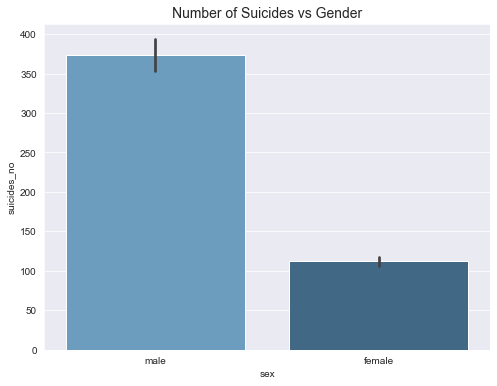

In [12]:
# Which gender's people has committed more suicides?
plt.figure(figsize=(8,6))
sns.barplot(x=df['sex'],y=df['suicides_no'],palette='Blues_d')
plt.title('Number of Suicides vs Gender',size=14)

Observation: Males has committed more number of suicides than the females.

#### Analysing variable 'country'

In [13]:
# How many countries are there?
print('Total number of countries:',df['country'].nunique())
count = df['country'].value_counts()
print('Total data-points for each country (top 10):\n',count.head(10))

Total number of countries: 101
Total data-points for each country (top 10):
 Netherlands      382
Austria          382
Mauritius        382
Iceland          382
United States    372
Spain            372
Singapore        372
Belgium          372
Italy            372
Israel           372
Name: country, dtype: int64


Text(0, 0.5, 'Count')

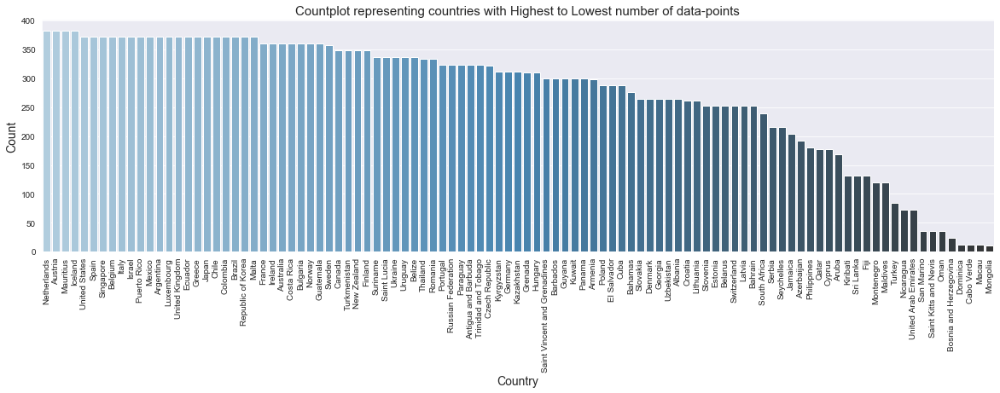

In [14]:
count = df['country'].value_counts().sort_values()

plt.figure(figsize=(20,5))
sns.countplot(df['country'],order=df['country'].value_counts().index,palette='Blues_d')
plt.xticks(rotation=90)
plt.title('Countplot representing countries with Highest to Lowest number of data-points',size=15)
plt.xlabel('Country',size=14)
plt.ylabel('Count',size=14)

Observation: Here we can see a clear picture that for which country the dataset have highest and lowest number of datapoitns.

Countries Mauritius, Austria, Netherlands and Iceland have highest number of data-points while the countries like Mongolia,Dominica, Macau have fewer number of data-points.

In [15]:
result = df.groupby(["country"]).agg({'suicides_no' : "mean"}).reset_index().sort_values(by=['suicides_no'],  ascending=False)
result.head(4)

,country,suicides_no
75,Russian Federation,3733.771605
98,United States,2779.604839
46,Japan,2169.091398
95,Ukraine,952.232143


Text(0, 0.5, 'Country')

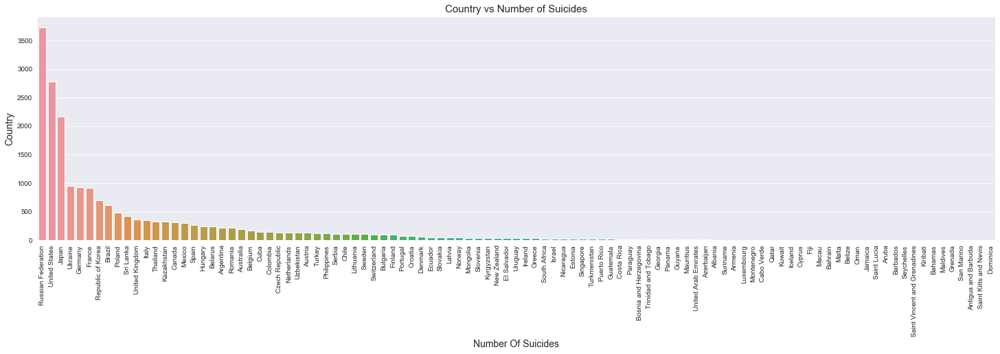

In [16]:
# Which country have the highest number of Suicide cases ?
# barplot to see the relation between the number of suicide and the country
plt.figure(figsize=(25,6))
sns.barplot(x='country', y="suicides_no", data=result, order=result['country'])
plt.xticks(rotation=90)
plt.title('Country vs Number of Suicides',size=15)
plt.xlabel('Number Of Suicides',size=14)
plt.ylabel('Country',size=14)

Observation: We can see that people of developed nations like US, Japan tend to commit more as compared to the other country's people and most of them are males which is obvious.

#### Analysing variable 'year'

In [17]:
# How many years data we have?
print('Total number of years:',df['year'].nunique())
count = df['year'].value_counts()
print('Total data-points for each year:\n',count)

Total number of years: 32
Total data-points for each year:
 2009    1068
2001    1056
2010    1056
2007    1032
2011    1032
2002    1032
2003    1032
2000    1032
2006    1020
2008    1020
2005    1008
2004    1008
1999     996
2012     972
2013     960
1998     948
2014     936
1995     936
1996     924
1997     924
1994     816
1992     780
1993     780
1990     768
1991     768
2015     744
1987     648
1989     624
1988     588
1986     576
1985     576
2016     160
Name: year, dtype: int64


In [18]:
year = count.index.sort_values()
print('We have data from the year {} to year {}'.format(year[0],year[-1]))

We have data from the year 1985 to year 2016


Text(0.5, 1.0, "Countplot representing each Year's data w.r.t. Gender")

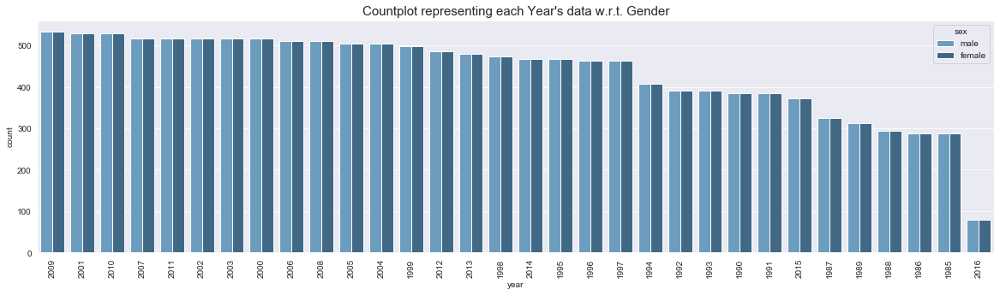

In [19]:
# Which year has highest number of data-points?
# countplot: for getting clear picture of each year's data
plt.figure(figsize=(20,5))
sns.countplot(df['year'],order=df['year'].value_counts().index,palette='Blues_d',hue=df['sex'])
plt.xticks(rotation=90)
plt.title("Countplot representing each Year's data w.r.t. Gender",size=15)

Observation: For year 2009 the dataset has highest number of data-points and for the year 2016 the dataset has fewer data-points.

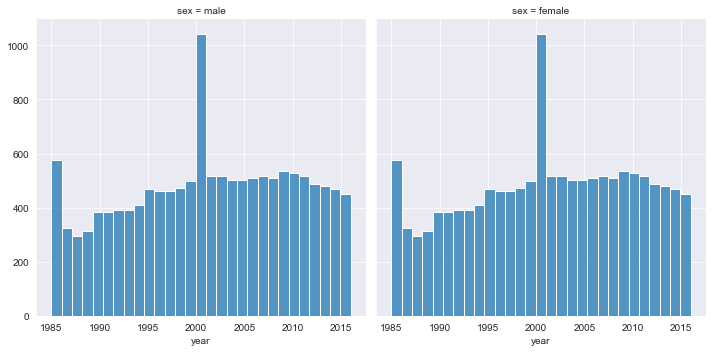

In [20]:
# Now let's draw histogram
g = sns.FacetGrid(df,col='sex',height=5)
g.map(sns.histplot,'year')


Observation: The year feature is evenly distributed for almost all the variables. There is no much variations in this feature.

Text(0.5, 1.0, 'LinePlot representing Number of Suicides vs Year w.r.t Gender')

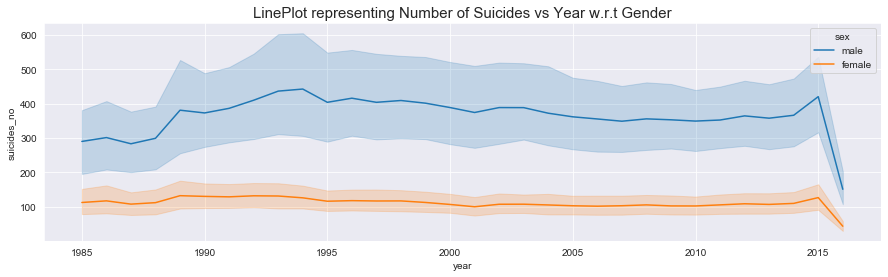

In [21]:
# LinePlot
plt.figure(figsize=(15,4))
sns.lineplot(x=df['year'],y=df['suicides_no'],hue=df['sex'])
plt.title('LinePlot representing Number of Suicides vs Year w.r.t Gender',size=15)

Observation: Highest number of suicides were committed in the year 1993 and 1994 by males. But there is no change in trend can be seen for the females. Suicide commited by the females remained same over all the years. The sudden fall that we have for year 2016 is because we have very fewer points for the year 2016.

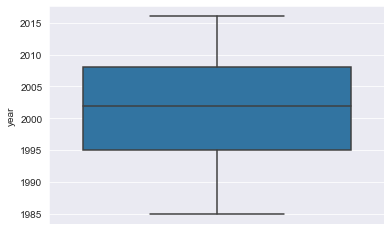

In [22]:
# there no outliers in the 'year', we have already seen that the data was almost stable
sns.boxplot(y=df['year'])

#### Analysing variable 'age'

In [23]:
# How many age groups do we have ?
print('Total number of unique age groups:',df['age'].nunique())
count = df['age'].value_counts()
print('Total data-points for each age group:\n',count)

Total number of unique age groups: 6
Total data-points for each age group:
 15-24 years    4642
55-74 years    4642
75+ years      4642
25-34 years    4642
35-54 years    4642
5-14 years     4610
Name: age, dtype: int64


Text(0.5, 1.0, 'Countplot representing each Age-group')

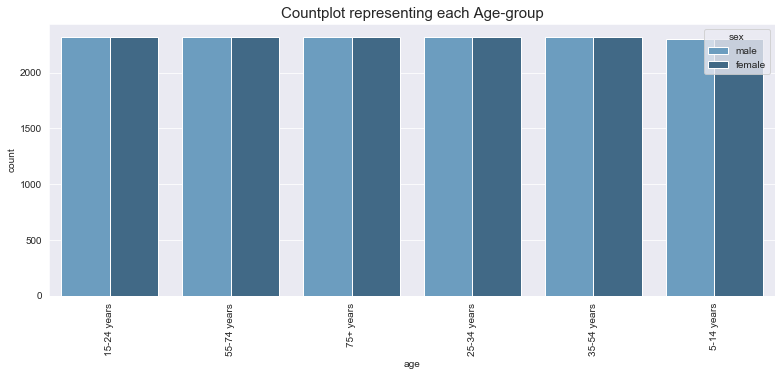

In [24]:
# countplot: for getting clear picture of each year's data
plt.figure(figsize=(13,5))
sns.countplot(df['age'],order=df['age'].value_counts().index,palette='Blues_d',hue=df['sex'])
plt.xticks(rotation=90)
plt.title('Countplot representing each Age-group',size=15)

Observation: Dataset have equal number of data-points for each age-group, for both males and females.

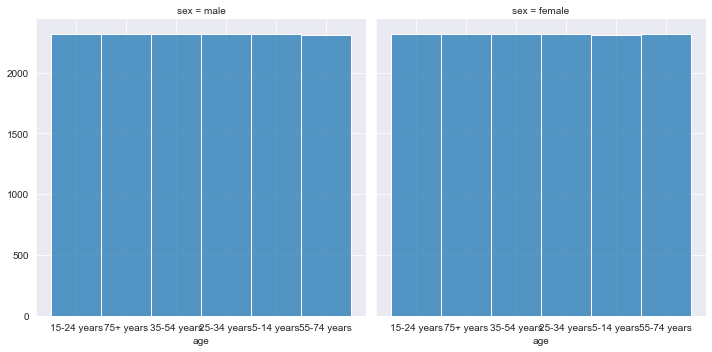

In [25]:
# distribution of age-group: uniform distribution
g = sns.FacetGrid(df,col='sex',height=5)
g.map(sns.histplot,'age')

Text(0.5, 1.0, 'Number of Suicides vs Age-Group')

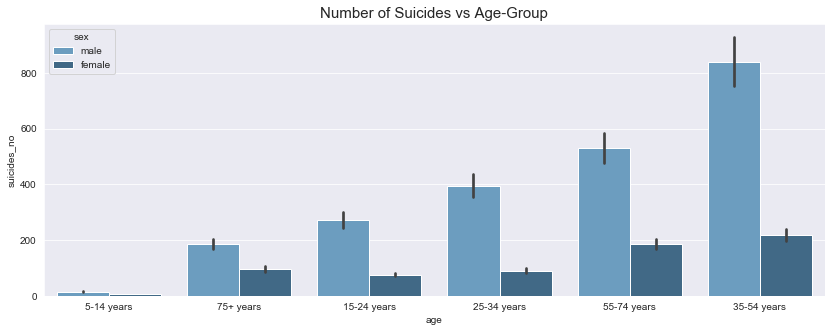

In [26]:
# Which Age-group has committed highest and lowest number of suicides?
result = df.groupby(["age"])['suicides_no'].aggregate(np.median).reset_index().sort_values('suicides_no')
plt.figure(figsize=(14,5))
sns.barplot(x='age', y="suicides_no", data=df, order=result['age'],hue=df['sex'],palette='Blues_d')
plt.title('Number of Suicides vs Age-Group',size=15)

Observation: People of Age group 35-54 years tend to suicide more than the people of the other age groups most of which are males. And people of age group 5-14 year don't suicide as much as compared to other age groups which makes sense.

#### Analysing  feature 'population'

In [27]:
# type of variable: continuous
df['population'].nunique()

25564

In [28]:
# distribution: for analysing this feature we will use plotly because plotly is fast and attractive, and represents underlying
# information elegantly.
import plotly.express as px
fig = px.histogram(df, x='population')
fig.show()

Observation:

There are 8891 countries with population between 0-200K.

There are few number of countries with very high poplation and there are large number of countries with lower population. So this leads to a skewed distribution.

In [29]:
import scipy.stats as stats
def plots(df, variable):
    '''Function that plots Histogram, Q-Q Plot and Boxplot for visualising the outliers 
            and distribution of the data'''
    plt.figure(figsize=(16, 5))

    # histogram
    plt.subplot(1, 3, 1)
    sns.distplot(df[variable], bins=30,kde_kws={'bw':1})
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

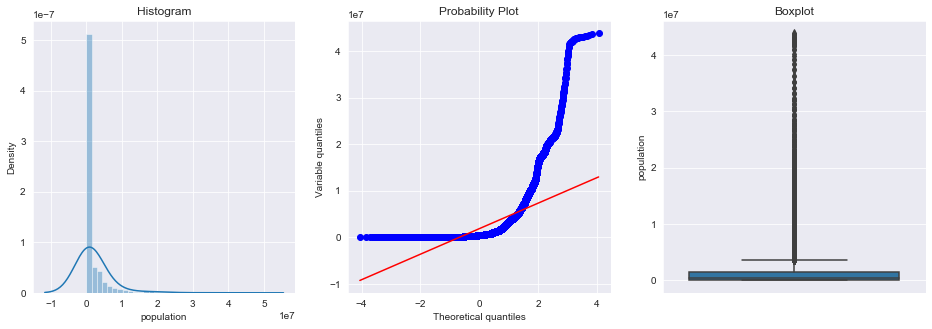

In [30]:
plots(df,'population')

Observation: This feature is heavily skewed and have huge amount of outliers.

In [31]:
result = df.groupby(["country"]).agg({'population' : "sum",'suicides_no':'sum'}).reset_index().sort_values(by=['population'],  ascending=False)
result.head()

,country,population,suicides_no
98,United States,8054027201,1034013
15,Brazil,4856093548,226613
75,Russian Federation,3690802620,1209742
46,Japan,3681024844,806902
58,Mexico,2772959159,111139


In [32]:
# Is there any ralation between the Population of a country and number of suicides ?
fig = px.scatter(result, x='population', y='suicides_no',color='country')
fig.show()


Observation: 
* We can see that the Highest number of sucides committed from 1958 to 2016 is in Russian Federationa which is 1.209742 million suicides over total population of 3.7 billion.
* We can also a relation between the number of suicide and the population.


Text(0, 0.5, 'Country')

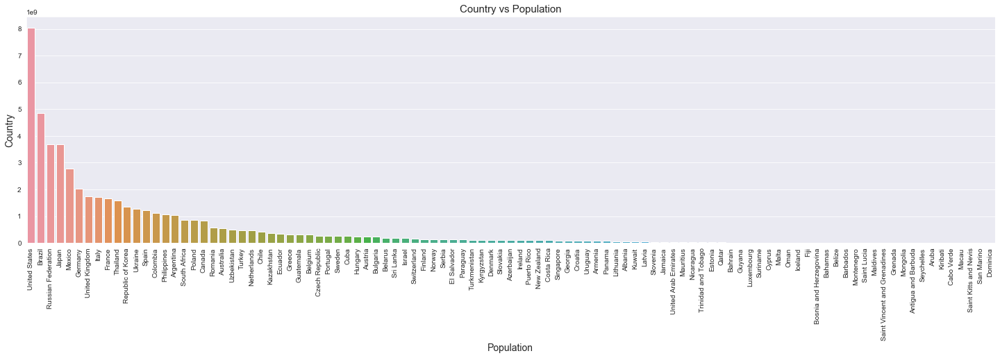

In [33]:
# Countries with highest and lowest population
plt.figure(figsize=(25,6))
sns.barplot(x='country', y="population", data=result, order=result['country'])
plt.xticks(rotation=90)
plt.title('Country vs Population',size=15)
plt.xlabel('Population',size=14)
plt.ylabel('Country',size=14)

Observation: USA has highest population followed by Brazil and Dominica has the lowest population.

#### Analysing variable suicides/100k population

In [34]:
# tpye of varaible : Continues
df['suicides/100k pop'].nunique()

5298

In [35]:
fig = px.histogram(df, x="suicides/100k pop")
fig.show()

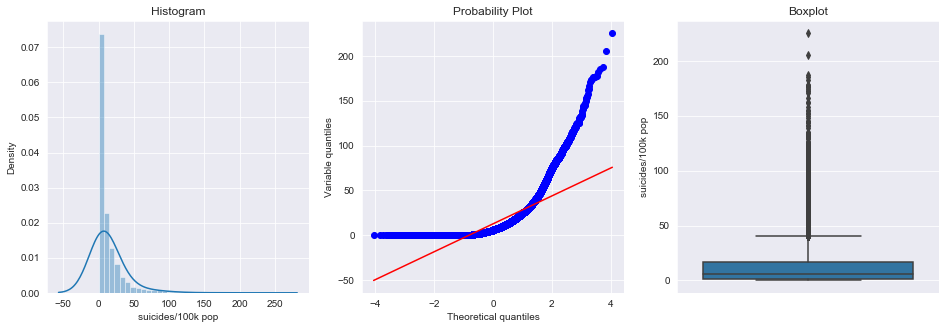

In [37]:
plots(df,'suicides/100k pop')

In [38]:
# countries with high suicide rate
rate = df['suicides/100k pop'].value_counts().index.sort_values()
print( 'Highest Suicide Rate per 100k Population:',rate[-1])

Highest Suicide Rate per 100k Population: 224.97


Text(0.5, 1.0, 'Suicide-rate vs Country')

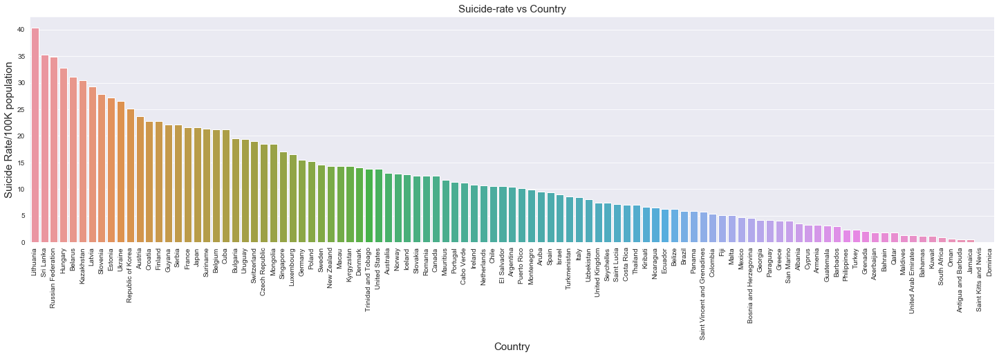

In [39]:
# Country with highest Suicide Rate
result = df.groupby(['country']).agg({'suicides/100k pop':'mean','suicides_no':'mean'}).reset_index().sort_values(['suicides/100k pop'],ascending=False)
plt.figure(figsize=(25,6))
sns.barplot(x='country', y="suicides/100k pop", data=result, order=result['country'])
plt.xticks(rotation=90)
plt.xlabel('Country',size=15)
plt.ylabel('Suicide Rate/100K population',size=15)
plt.title('Suicide-rate vs Country',size=15)

Sri Lanka, Lithuania, Russia, Hungary, Belarus have Suicide Rate greater than 30 for per 100K population.

In [40]:
# relation with dependent variable
fig = px.scatter(result, x="suicides/100k pop",y='suicides_no',color='country')
fig.show()

 Country with highest suicide rate is Lithuania and Dominica has the lowest suicide rate.

#### Analysing variable ''HDI for year"

In [41]:
# type of variable: contiues
df['HDI for year'].nunique()

305

In [42]:
df['HDI for year'].count()

8364

In [43]:
# Distribution:
fig = px.histogram(df,x='HDI for year')
fig.show()

Text(0.5, 1.0, 'HDI vs Country')

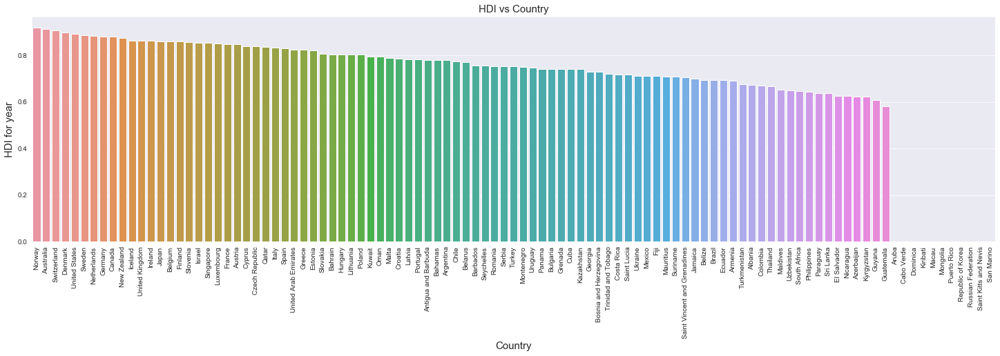

In [44]:
result = df.groupby(['country']).agg({'HDI for year':'mean','suicides_no':'sum'}).reset_index().\
sort_values('HDI for year',ascending=False)
plt.figure(figsize=(25,6))
sns.barplot(x='country', y="HDI for year", data=result, order=result['country'])
plt.xticks(rotation=90)
plt.xlabel('Country',size=15)
plt.ylabel('HDI for year',size=15)
plt.title('HDI vs Country',size=15)

Norway has the Highest HDI followed by Austrailia. But there are some Countries for which we don't have HDI data, which was expected as this feature has many missing  values.

In [45]:
fig = px.scatter(result,y='suicides_no',x='HDI for year',color='country')
fig.show()

Observation:
* Norway has the highest HDI(mean) and the number of suicides are very low as compared to other countries, same can be applied to Austrailia and Switzerland.
* Even though US has high HDI but the number of suicides are also very high and same applied to Japan.

#### Analysing feature 'gdp_per_year'

In [46]:
# renaming
df.rename(columns={' gdp_for_year':'gdp_for_year'},inplace=True)

In [47]:
# type of variable: continues
df['gdp_for_year'].nunique()

2321

In [48]:
gdp = df['gdp_for_year'].value_counts().index.sort_values()
print('Highest GDP: ',gdp[0])
print('Lowest GDP : ',gdp[-1])

Highest GDP:  1,002,219,052,968
Lowest GDP :  997,007,926


In [49]:
# distribution 
fig = px.histogram(df,x='gdp_for_year')
fig.show()

Most of the Countrie's GDP is very low, on the other hand there are few countires whose GDP is very high.

In [50]:
df.columns

Index(['country', 'year', 'sex', 'age', 'suicides_no', 'population',
       'suicides/100k pop', 'country-year', 'HDI for year', 'gdp_for_year',
       'gdp_per_capita', 'generation'],
      dtype='object')

In [51]:
# removing commas from the variable 'gdp_for_year'
df['gdp_for_year'] = df.gdp_for_year.str.replace(',','')

In [52]:
# converting from object to float, otherwise it will raise error
df['gdp_for_year'] = df['gdp_for_year'].astype(float)

Text(0.5, 1.0, 'HDI vs Country')

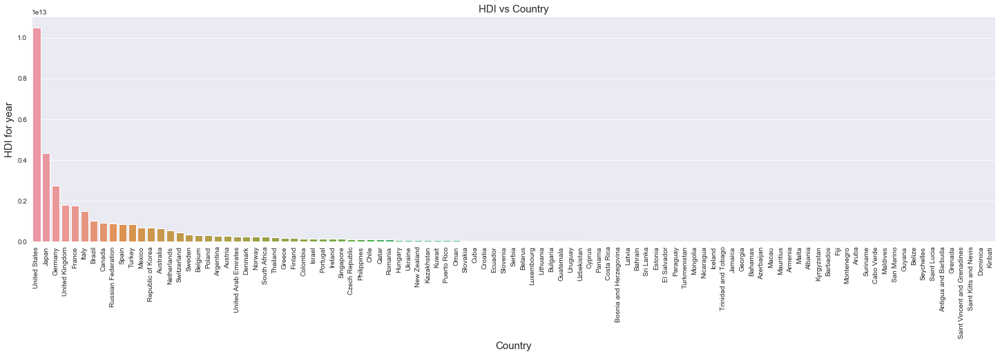

In [53]:
result = df.groupby(['country']).agg({'gdp_for_year':'mean','suicides_no':'sum'}).reset_index().\
sort_values('gdp_for_year',ascending=False)
# plotting
plt.figure(figsize=(25,6))
sns.barplot(x='country', y="gdp_for_year", data=result, order=result['country'])
plt.xticks(rotation=90)
plt.xlabel('Country',size=15)
plt.ylabel('HDI for year',size=15)
plt.title('HDI vs Country',size=15)

US has the highest GDP for year(mean). 

In [54]:
fig = px.scatter(result,x='gdp_for_year',y='suicides_no',color='country')
fig.show()

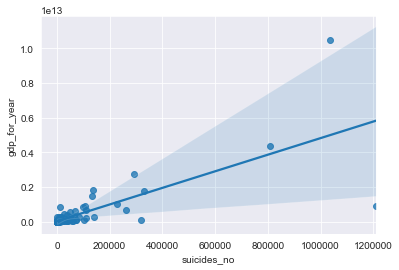

In [55]:
# regression plot
sns.regplot(y=result['gdp_for_year'],x=result['suicides_no'])

Observation:
* Despite US has highest GDP, the number of suicides committed in the country are also very high.
* We can say that as the GDP of the country increases the number of suicides also increases.

In [56]:
fig = px.line_3d(df,x='year',y='gdp_for_year',z='suicides_no',color='country')
fig.show()

For US we can say that as the GDP increases the Number of Suicides also increases.

For Russia we can see that as the GDP increases the Number of Suicides dcreases and as the GDP decreases  the number of Suicides increases.

####  Analysing feature "gdp_per_capita"

In [57]:
# type of variable
df['gdp_per_capita'].nunique()

2233

In [58]:
capita_gdp = df['gdp_per_capita'].value_counts().index.sort_values()
print('Lowest GDP  : ',capita_gdp[0])
print('Highest GDP : ',capita_gdp[-1])

Lowest GDP  :  251
Highest GDP :  126352


In [59]:
# distribution 
fig = px.histogram(df,x='gdp_per_capita')
fig.show()

This variable is also skewed.

Text(0.5, 1.0, 'gdp_per_capita vs Country')

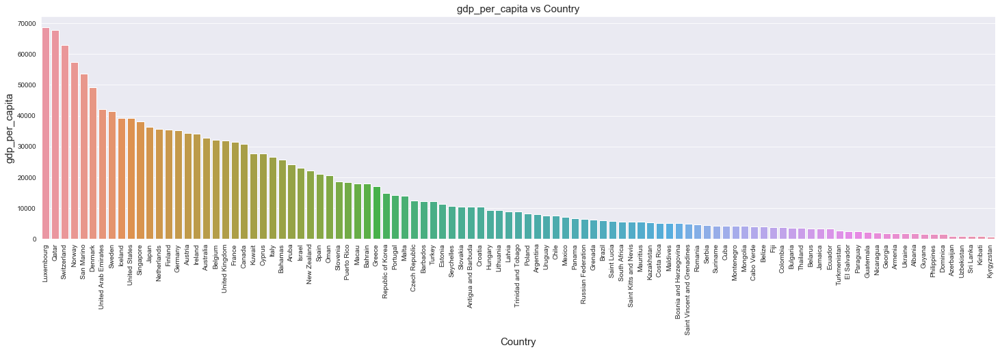

In [60]:
result = df.groupby(['country']).agg({'gdp_per_capita':'mean','suicides_no':'mean'}).reset_index().\
sort_values('gdp_per_capita',ascending=False)
# plotting
plt.figure(figsize=(25,6))
sns.barplot(x='country', y="gdp_per_capita", data=result, order=result['country'])
plt.xticks(rotation=90)
plt.xlabel('Country',size=15)
plt.ylabel('gdp_per_capita',size=15)
plt.title('gdp_per_capita vs Country',size=15)

In [61]:
fig = px.scatter(result,x='gdp_per_capita',y='suicides_no',color='country')
fig.show()

Observation:
* Russia has low GDP per capita and has higher number of suicides.

* US has GDP per capita between 30K to 40K and the up-trend can be seen in the number of Suicides.

* Luxembourg has High GDP per capita and lower number of Suicides can be seen.

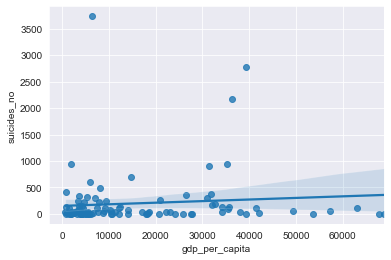

In [62]:
sns.regplot(x=result['gdp_per_capita'],y=result['suicides_no'])

#### Analysing variable "generation"

In [63]:
# type of variable: discrete
df['generation'].nunique()

6

In [64]:
df['generation'].value_counts()

Generation X       6408
Silent             6364
Millenials         5844
Boomers            4990
G.I. Generation    2744
Generation Z       1470
Name: generation, dtype: int64

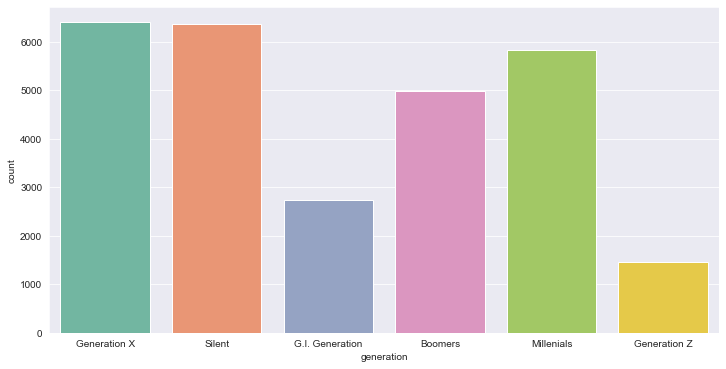

In [65]:
# countPlot
plt.figure(figsize=(12,6))
sns.countplot(df['generation'],palette='Set2')


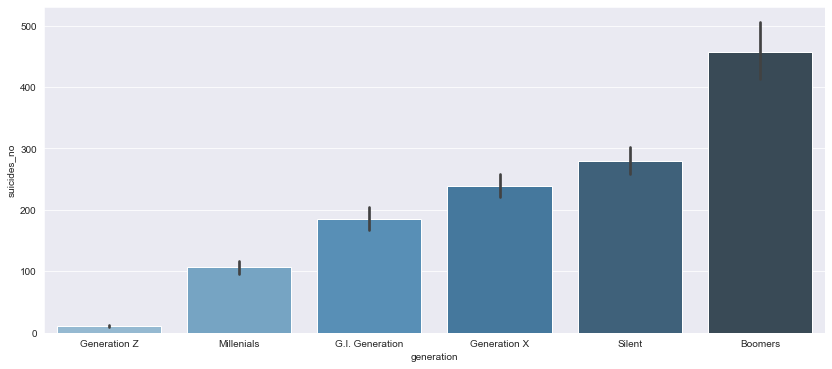

In [66]:
sns.set_style('darkgrid')
plt.figure(figsize=(14,6))
sns.barplot(x=df['generation'],y=df['suicides_no'],palette='Blues_d',
           order=['Generation Z','Millenials','G.I. Generation','Generation X','Silent','Boomers'])

People born between the year 1946-1964 (Boomers) show highest number of Suicides. 

People born between 1996-2012 (Generation Z) show lower number of Suicides.

In [67]:
# distribution
fig = px.histogram(df,x='suicides_no')
fig.show()

Conclusion:
* USA, Russia and Japan have higher population and also the number of sucides are very high from the rest of the countries.
* People who had committed most suicides belong from the Boomers genrration most of which are males having age between 35 to 54 years. 
* GDP of the countries was also connected with the trend of the suicide, for Russia it can be seen that  as the GDP increases the number of suicides dreases and as the number of suicides dcreases the number of suicides also dcreases.
